In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

from tensorflow import keras


In [2]:
def PSNR(super_resolution, high_resolution):
    """Compute the peak signal-to-noise ratio, measures quality of image."""
    # Max value of pixel is 255
    psnr_value = tf.image.psnr(high_resolution, super_resolution, max_val=255)[0]
    return psnr_value

def plot_results(lowres, preds):
    """
    Displays low resolution image and super resolution image
    """
    plt.figure(figsize=(24, 14))
    plt.subplot(132), plt.imshow(lowres), plt.title("Low resolution")
    plt.subplot(133), plt.imshow(preds), plt.title("Prediction")
    plt.show()

def predict_step(model, x):
    """
    Predicts the high resolution image from the low resolution image 
    """

    # Adding dummy dimension using tf.expand_dims and converting to float32 using tf.cast
    # This step is necessary because the model was trained with 4D tensors (batch, height, width, color)
    x = tf.cast(tf.expand_dims(x, axis=0), tf.float32)
    # Passing low resolution image to model
    super_resolution_img = model.predict(x)
    # Clips the tensor from min(0) to max(255)
    # If the RGB code is below 0 or above 255, it will be set as 0 or 255, respectively 
    super_resolution_img = tf.clip_by_value(super_resolution_img, 0, 255)
    # Rounds the values of a tensor to the nearest integer, because RGB codes are integers
    super_resolution_img = tf.round(super_resolution_img)
    # Removes dimensions of size 1 from the shape of a tensor (to remove the dummy dimension) and converts to uint8
    super_resolution_img = tf.squeeze(
        tf.cast(super_resolution_img, tf.uint8), axis=0)
    return super_resolution_img


## Testing saved model (x2 upscaling)

In [3]:
# Download DIV2K from TF Datasets

# Using bicubic x2 degradation type
div2k_data = tfds.builder('div2k', config = 'bicubic_x2')
div2k_data.download_and_prepare()

# Taking validation data div2k_data object
validation_data = div2k_data.as_dataset(split="validation",
                                        as_supervised=True # outputs a 2-tuple structure (low resolution image, high resolution image)
                                        )


1/1 [==============================] - 2s 2s/step


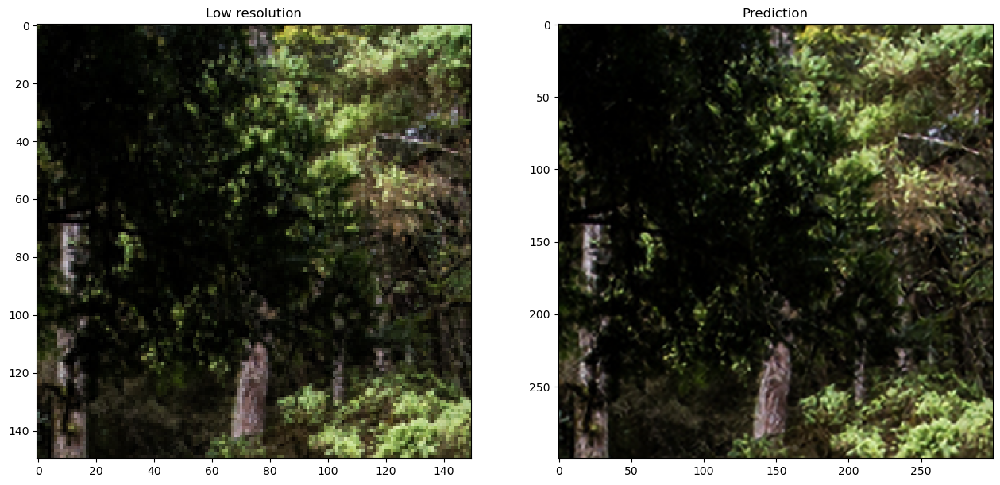

1/1 [==============================] - 1s 831ms/step


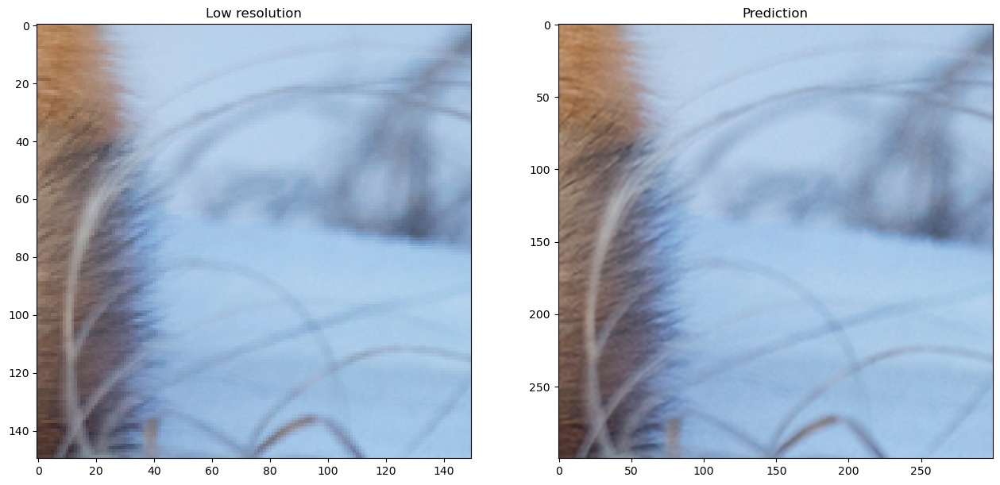

1/1 [==============================] - 1s 688ms/step


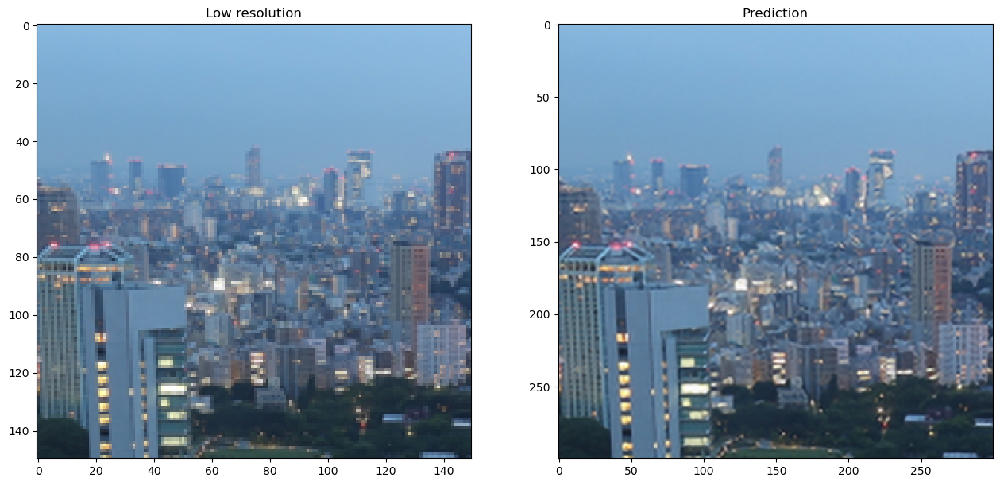

1/1 [==============================] - 1s 699ms/step


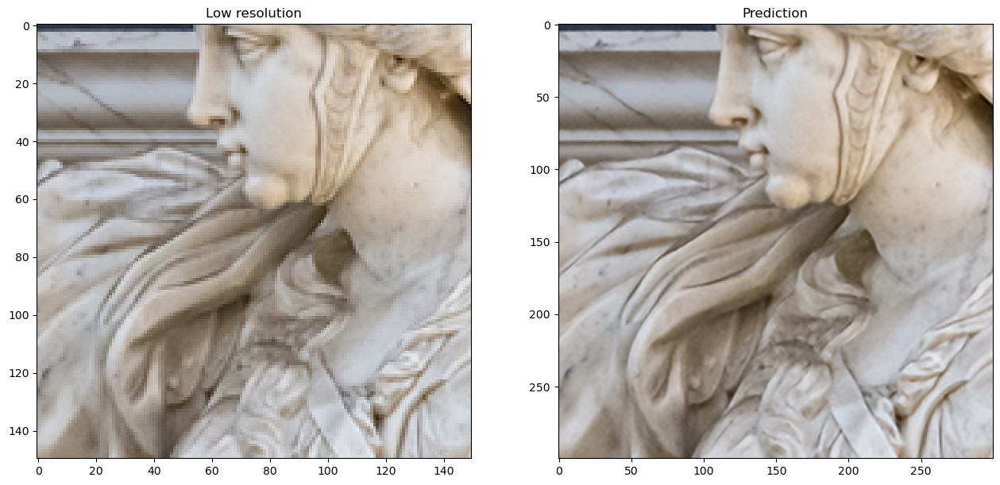

1/1 [==============================] - 1s 646ms/step


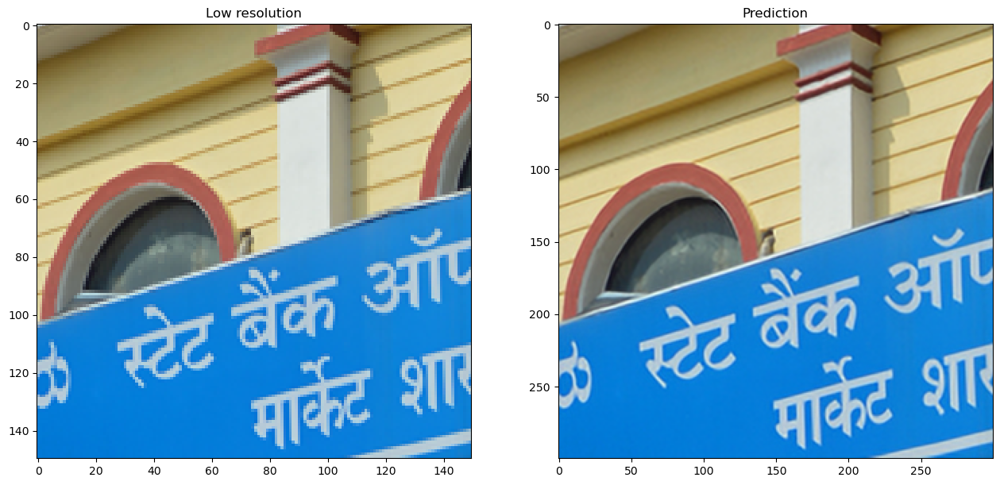

In [4]:
# Loading 2x model

model_2x = tf.keras.models.load_model('EDSR_2x.tf', 
                                       custom_objects={"PSNR":PSNR})

# Plotting predictions

for lowres, highres in validation_data.take(5):
    # The image is cropped so that the effect is clearer
    lowres = tf.image.random_crop(lowres, (150, 150, 3))
    preds = predict_step(model_2x,lowres)
    plot_results(lowres, preds)

## Testing Model with x4 Upscaling

In [5]:
# Download DIV2K from TF Datasets

# Using bicubic x4 degradation type
div2k_data = tfds.builder('div2k', config = 'bicubic_x4')
div2k_data.download_and_prepare()

# Taking validation data div2k_data object
validation_data = div2k_data.as_dataset(split="validation",
                                        as_supervised=True # outputs a 2-tuple structure (low resolution image, high resolution image)
                                        )


1/1 [==============================] - 1s 1s/step


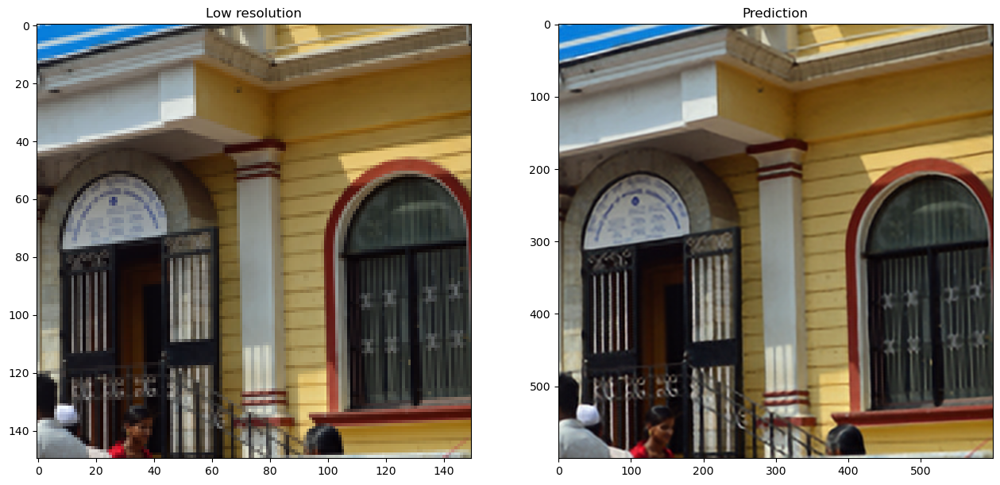

1/1 [==============================] - 1s 1s/step


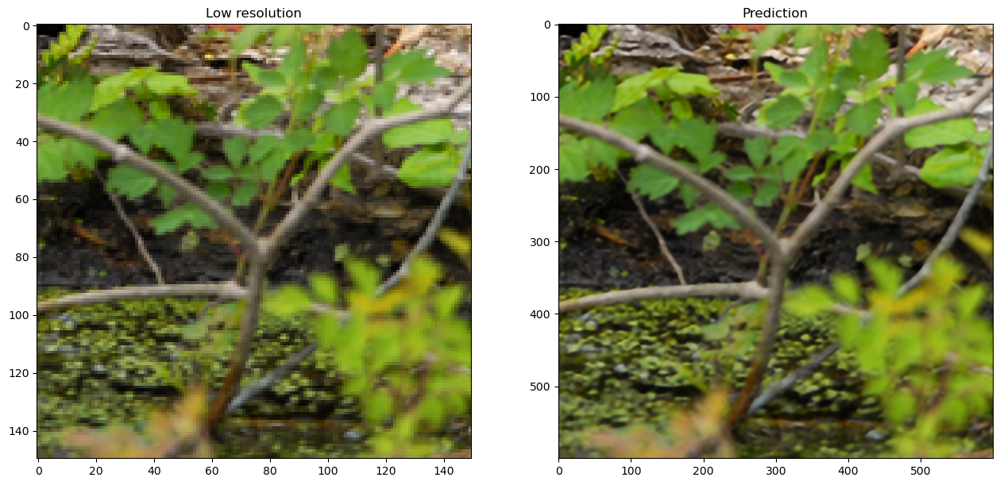

1/1 [==============================] - 1s 1s/step


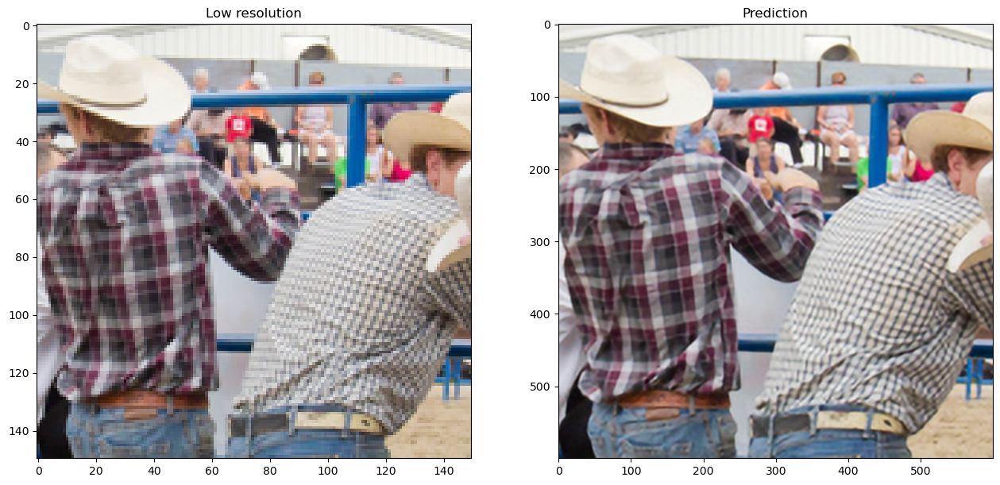

1/1 [==============================] - 2s 2s/step


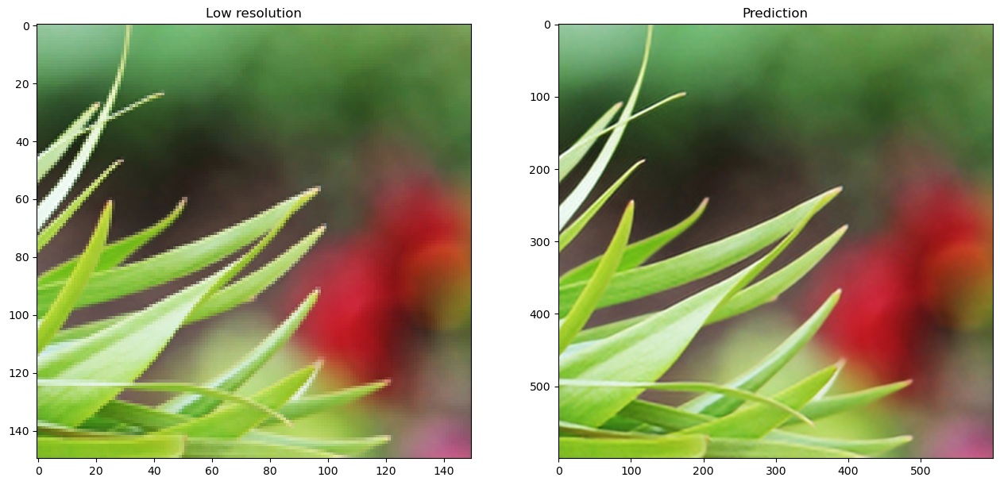

1/1 [==============================] - 1s 992ms/step


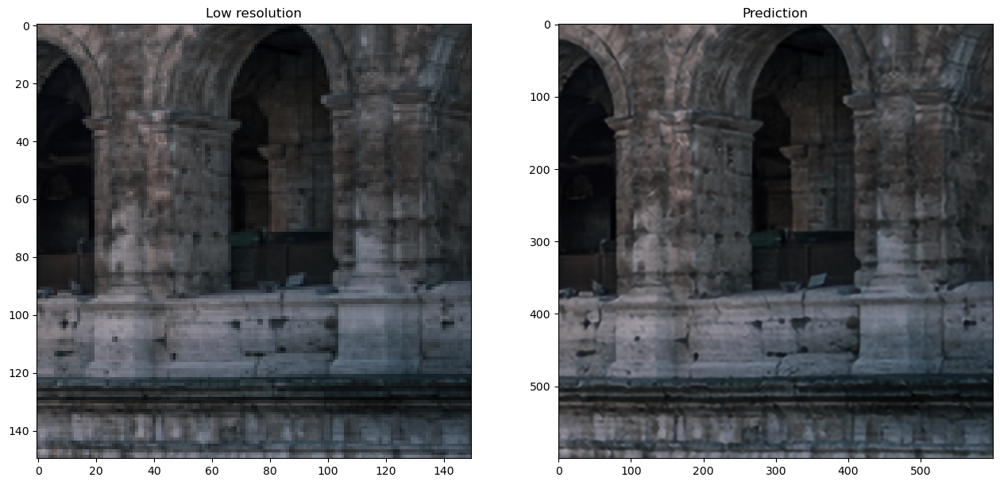

In [6]:
# Loading x4 model

model_4x = tf.keras.models.load_model('EDSR_4x.tf', 
                                       custom_objects={"PSNR":PSNR})

# Plotting predictions

for lowres, highres in validation_data.take(5):
    # The image is cropped so that the effect is clearer
    lowres = tf.image.random_crop(lowres, (150, 150, 3))
    preds = predict_step(model_4x,lowres)
    plot_results(lowres, preds)

## Testing Model with x8 Upscaling

In [7]:
# Download DIV2K from TF Datasets

# Using bicubic x8 degradation type
div2k_data = tfds.builder('div2k', config = 'bicubic_x8')
div2k_data.download_and_prepare()

# Taking validation data div2k_data object
validation_data = div2k_data.as_dataset(split="validation",
                                        as_supervised=True # outputs a 2-tuple structure (low resolution image, high resolution image)
                                        )


1/1 [==============================] - 3s 3s/step


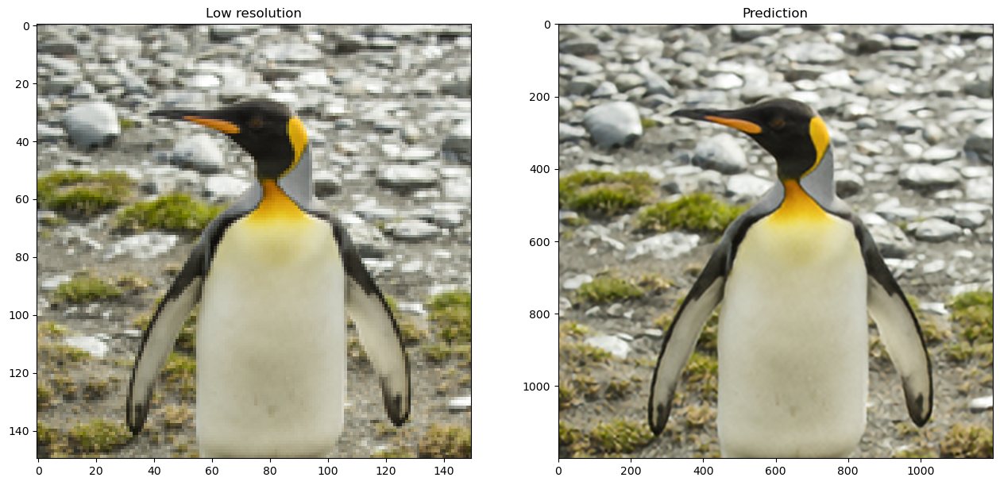

1/1 [==============================] - 3s 3s/step


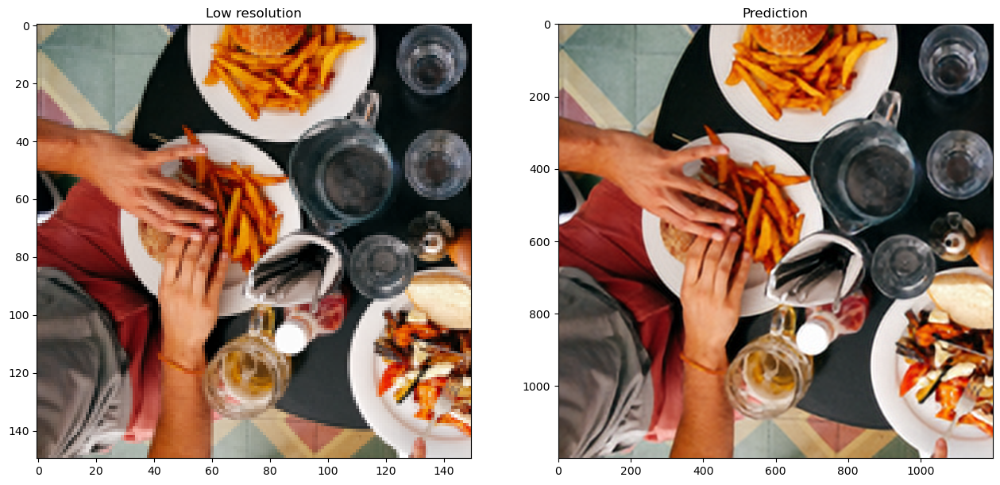

1/1 [==============================] - 3s 3s/step


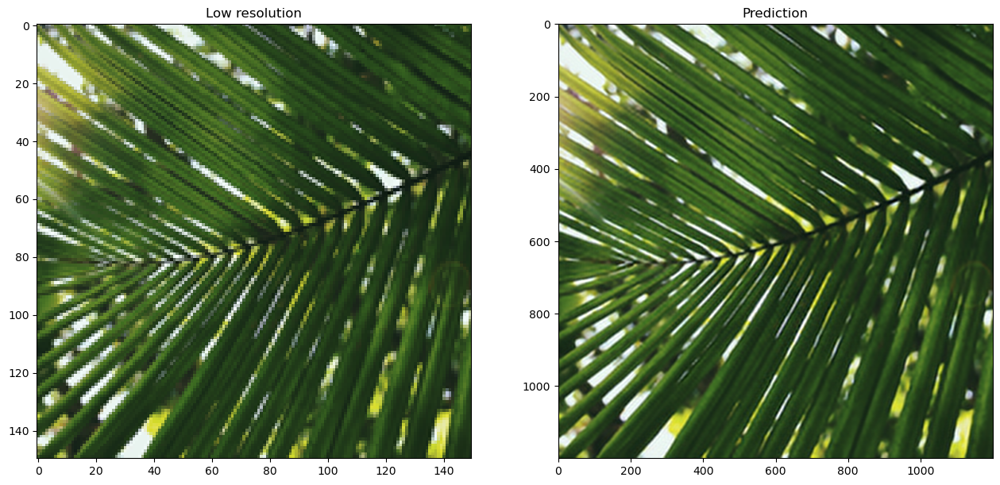

1/1 [==============================] - 3s 3s/step


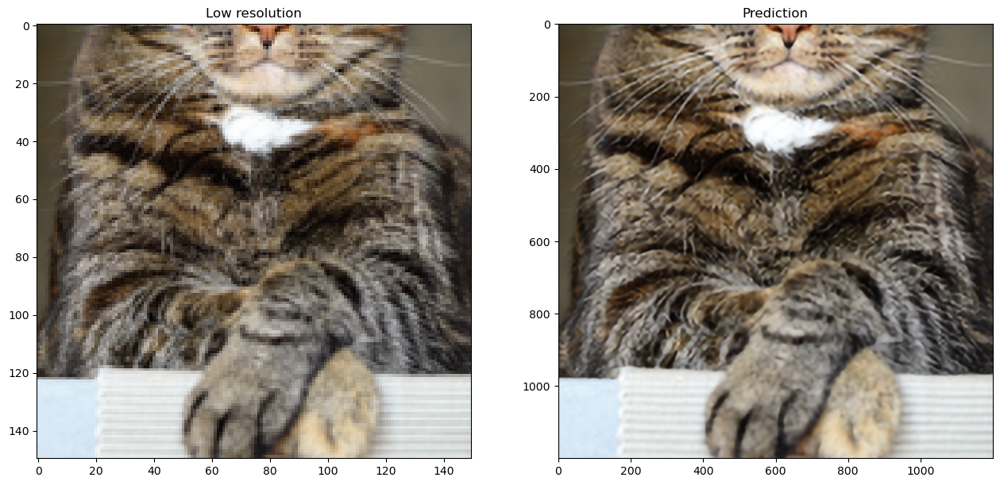

1/1 [==============================] - 3s 3s/step


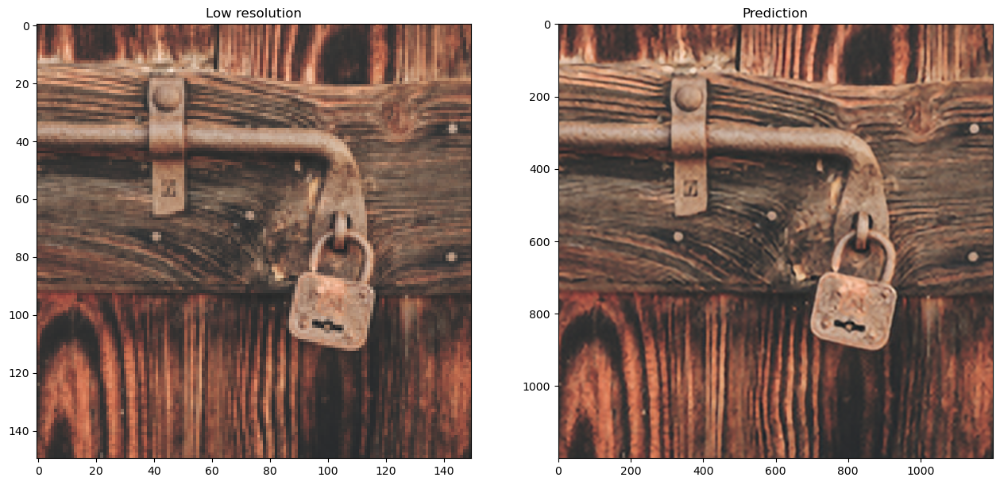

In [8]:
# Loading x8 model

model_8x = tf.keras.models.load_model('EDSR_8x.tf', 
                                       custom_objects={"PSNR":PSNR})

# Plotting predictions

for lowres, highres in validation_data.take(5):
    # The image is cropped so that the effect is clearer
    lowres = tf.image.random_crop(lowres, (150, 150, 3))
    preds = predict_step(model_8x,lowres)
    plot_results(lowres, preds)